In [3]:
import numpy as np
import scipy.optimize as fitter
import matplotlib.pyplot as plt

Offsets

In [6]:
left2Center = 2.65 #cm
left2RightBase = 4.00 #cm
pt = 0.04393e-3 #pts to meters

# Experiement 1

### 1.1: Single Diffraction Pattern

In [172]:
screenLocation = 87.0 #cm, on the optical bench
backboard = 0.0 #cm
rLambda = 635e-9
centerMaximumWidth = 2.5 * 0.2 #squares * scaling factor, cm

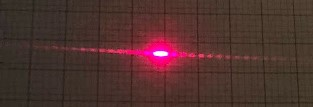

In [173]:
tileWidth = np.array([99,99,98,99,99])#Width of three tiles in pixels, correspondes to 3cm
conversion = (tileWidth.mean()*100 / 3)  #converts pixels to meters
maximaWidth = np.array([19,17,21,18,18])/conversion#width of maxima in pixels
maximaErr = maximaWidth.std() / np.sqrt(maximaWidth.size)
slitWidth = 2*(screenLocation/100)*rLambda/maximaWidth.mean()
slitErr =  maximaErr / maximaWidth.mean()
print('Calculated Maxima Width: {:.6f} mm'.format(maximaWidth.mean()*1e3))
print('Width Uncertainty: {:.6f} mm '.format(maximaErr*1e3))
print('Calculated Slit Width: {:.6f} mm'.format(slitWidth*1e3))
print('Slit Uncertainty: {:.6f} mm'.format(slitErr))                       
print('Real Slit Width: {:.6f} mm'.format(4*pt*1e3))

Calculated Maxima Width: 5.647773 mm
Width Uncertainty: 0.184199 mm 
Calculated Slit Width: 0.195635 mm
Slit Uncertainty: 0.032615 mm
Real Slit Width: 0.175720 mm


In [44]:
y = maximaWidth.mean()/2
L = (screenLocation/100)
theta = np.arctan( y / L)
print('Approximate Error from SAA: {:e}'.format(np.abs(1-theta / (y/L))))

Approximate Error from SAA: 3.511818e-06


### 1.2: Modifying the Pattern - Using a Lens

### 1.3: A method of measurement

In [4]:
minimaOffset = np.array([3, 6, 9, 11, 14])*0.2 #1,2,3,4,5 respectively (cm)
minimaUnc = 0.5*0.2 #(cm)
for i in range(minimaOffset.size):
    calcFirst = minimaOffset[i] / ((i+1)*2)
    calcUnc = minimaUnc / ((i+1)*2)
    print('Order {}'.format(int(i+1)))
    print('Calculated First Minima: {:.4f} cm'.format(calcFirst))
    print('Associated Uncertainty: {:.4f} cm'.format(calcUnc))

Order 1
Calculated First Minima: 0.3000 cm
Associated Uncertainty: 0.0500 cm
Order 2
Calculated First Minima: 0.3000 cm
Associated Uncertainty: 0.0250 cm
Order 3
Calculated First Minima: 0.3000 cm
Associated Uncertainty: 0.0167 cm
Order 4
Calculated First Minima: 0.2750 cm
Associated Uncertainty: 0.0125 cm
Order 5
Calculated First Minima: 0.2800 cm
Associated Uncertainty: 0.0100 cm


### 1.4: Changing the Wavelength

In [187]:
screenLoaction = 88.2
centerMaximum = 2 *0.2
minimaOffset = 18*0.2 #used 8th order as it lined up nicely 
minimaUnc = 0.5*0.2
firstMinima = minimaOffset / (8*2)
firstUnc = minimaUnc / (8*2) 
gLambda = (firstMinima/100 * 4*pt) / (2*screenLoaction/100)
gUnc = (firstUnc/100 * 4*pt) / (2*screenLoaction/100)
print('Calculated Wavelength: {:.2f} nm'.format(gLambda * 1e9))
print('Uncertainty: {:.2f} nm'.format(gUnc*1e9))

Calculated Wavelength: 224.13 nm
Uncertainty: 6.23 nm


# Experiment 2

### 2.1: Data Collection

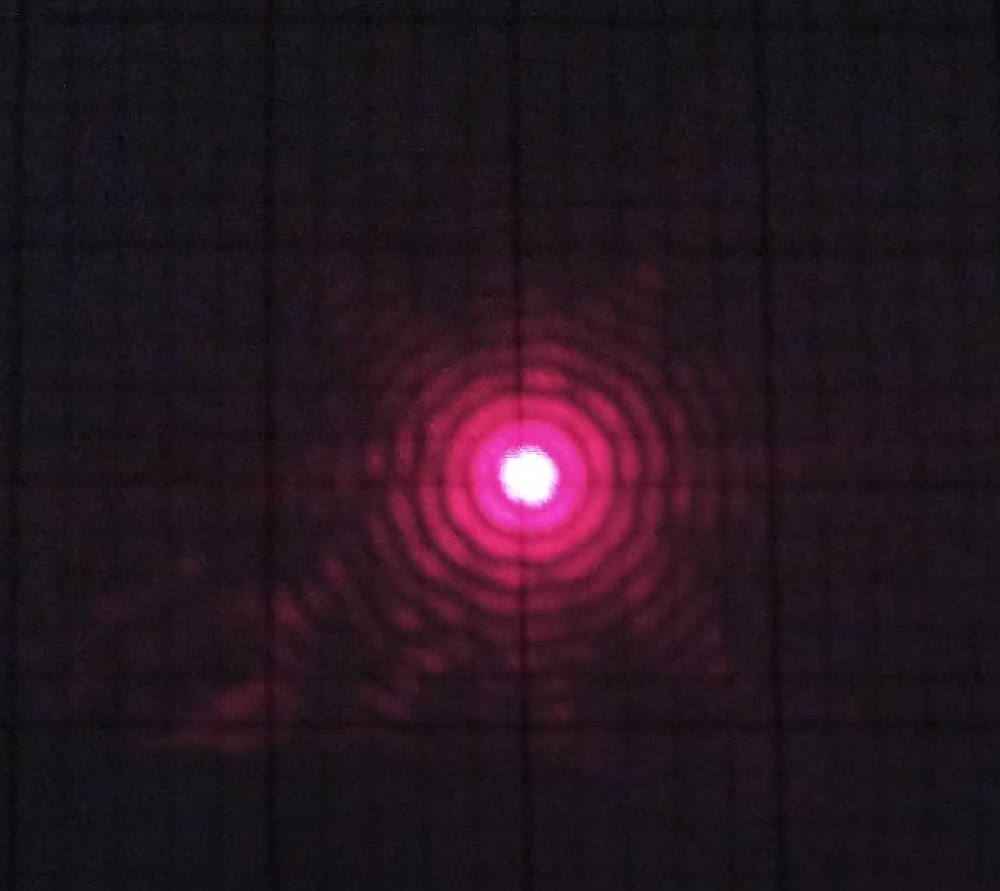

In [11]:
screenLocation = 87.8
rLambda = 635e-9
minimaLoc = np.array([[44,42,41,39,40],
                     [77,76,78,78,76],
                     [111,112,110,115,111],
                     [142,138,142,140,142]])#pixel measurements of diameters of 1-4 minima
scale = np.array([303,304,304,304,306])#pixel measurement of 2 large boxes corresponding to 2cm
conversion = 2 / scale.mean() #converts pixels to cm
print('Pixels per cm: {:.2f}'.format(1/conversion))

Pixels per cm: 152.10


In [29]:
y = minimaLoc[0].mean()/2 * conversion
L = screenLocation
apertureDiameter =  (1.22*rLambda) / np.sin(np.arctan(y/L))
print('Calculated Diameter of Screen: {:.6f} mu'.format(apertureDiameter*1e6))
realDiameter = 0.021 * 2.54 / 100
print('Given Diamter of Screen: {:.6f} mu'.format(realDiameter*1e6))

Calculated Diameter of Screen: 502.216043 mu
Given Diamter of Screen: 533.400000 mu


### 2.2: Data Analysis

In [41]:
experimentalTheta = np.arctan(minimaLoc.mean(axis=1)/2*conversion / L) #radians
bessel = np.array([3.8317, 7.0156, 10.1735, 13.3237])
predictedTheta = np.arcsin(bessel*rLambda/realDiameter/np.pi)
for i in range(experimentalTheta.size):
    print('Order {}'.format(int(i+1)))
    print('Predicted Theta: {:.2f} mili-radians'.format(predictedTheta[i] * 1e3) )
    print('Experimental Theta: {:.2f} mili-radians'.format(experimentalTheta[i] * 1e3) )
    print('Percent difference: {:.2f} %'.
          format((np.abs(experimentalTheta[i] - predictedTheta[i]) / predictedTheta[i])*100))

Order 1
Predicted Theta: 1.45 mili-radians
Experimental Theta: 1.54 mili-radians
Percent difference: 6.24 %
Order 2
Predicted Theta: 2.66 mili-radians
Experimental Theta: 2.88 mili-radians
Percent difference: 8.44 %
Order 3
Predicted Theta: 3.86 mili-radians
Experimental Theta: 4.19 mili-radians
Percent difference: 8.58 %
Order 4
Predicted Theta: 5.05 mili-radians
Experimental Theta: 5.27 mili-radians
Percent difference: 4.41 %


# Experiment 3

Aperture 3

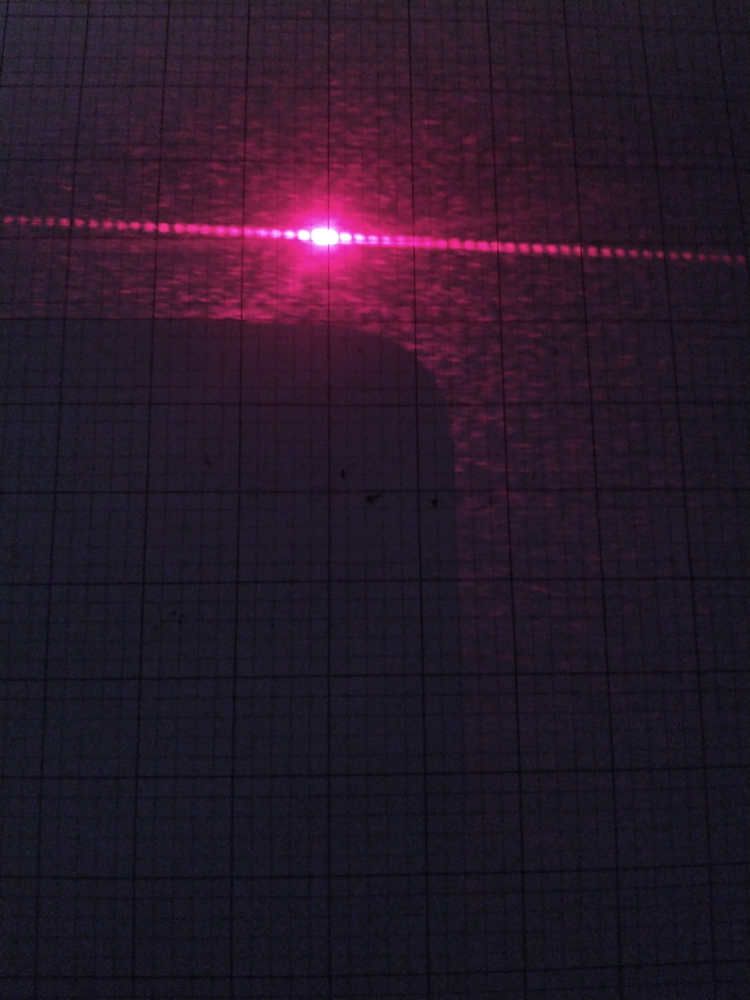

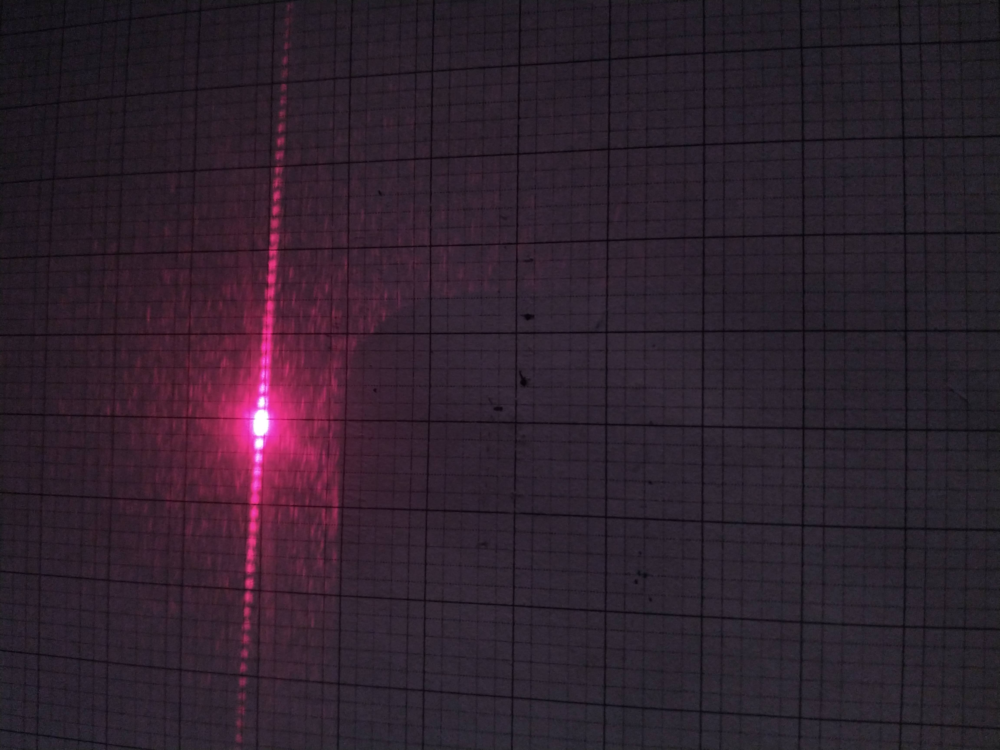

Aperture 2

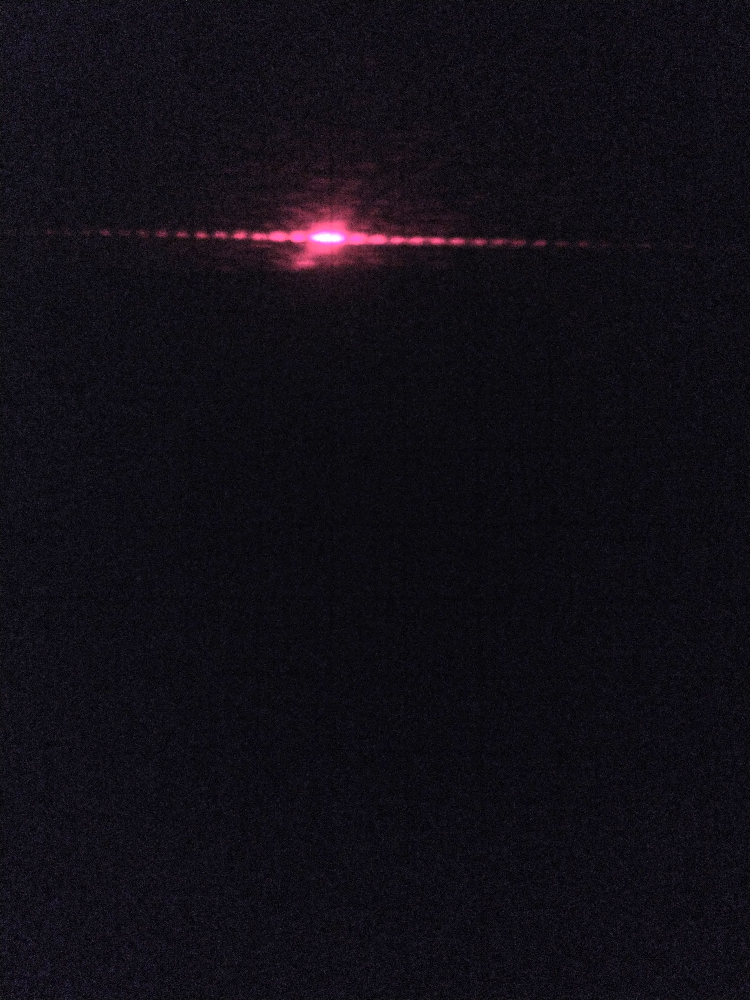

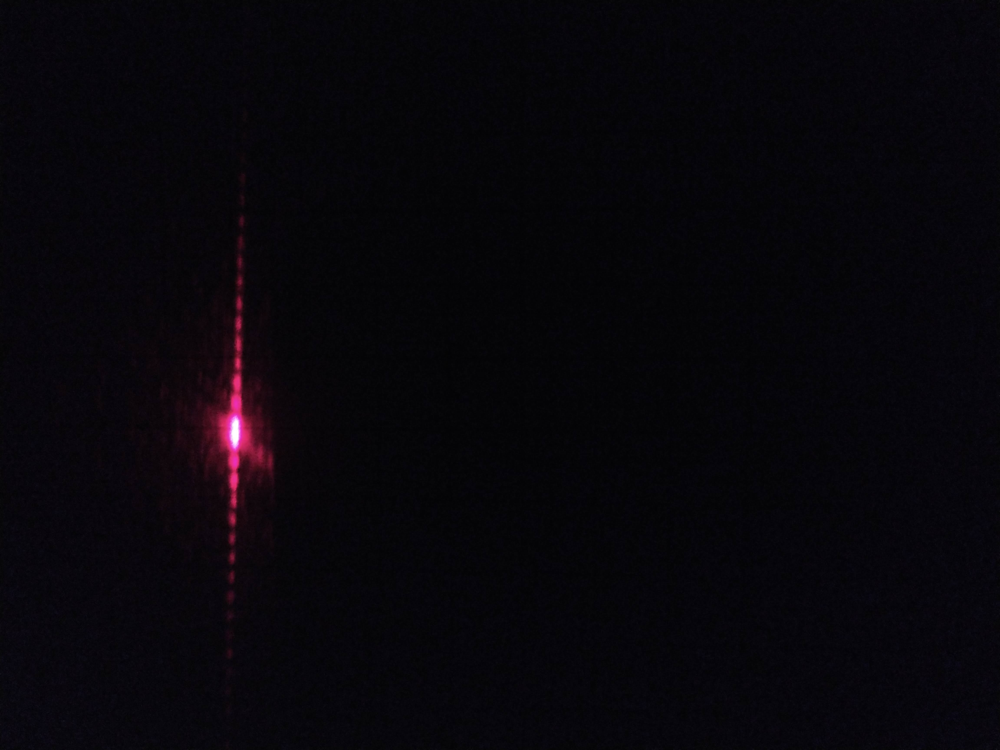

Aperture 1

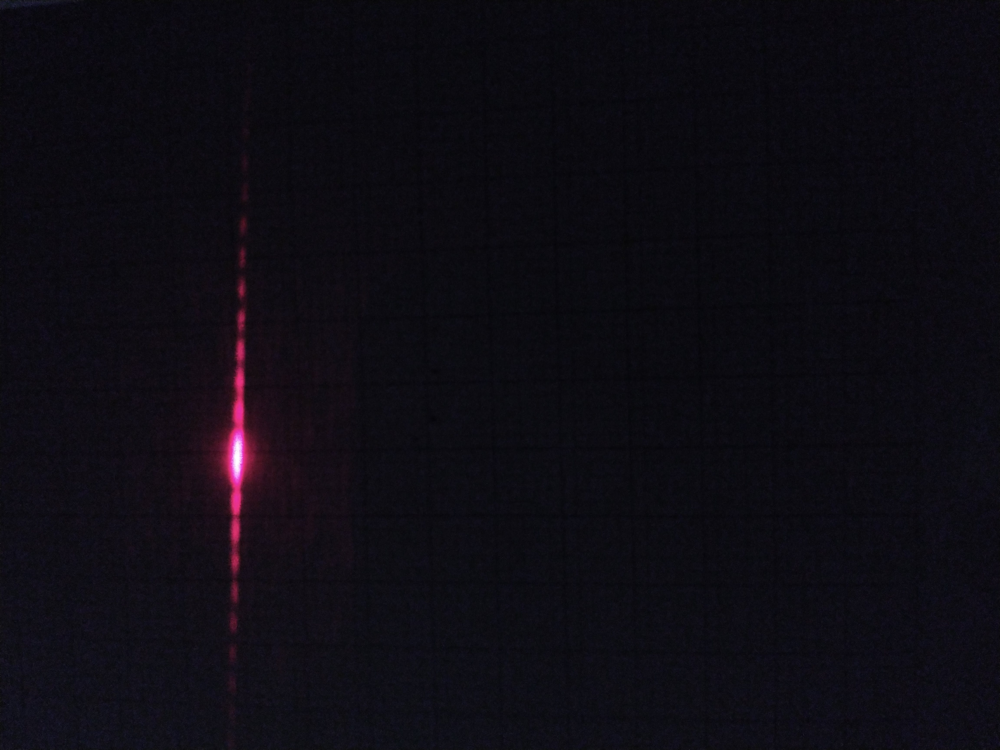

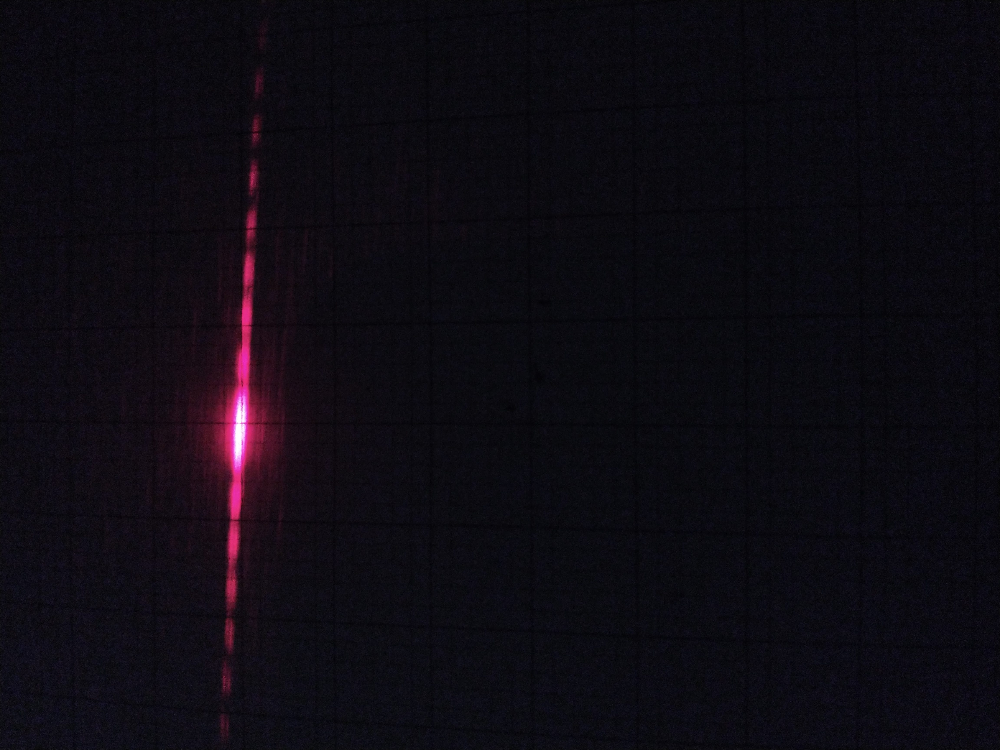

In [70]:
centerWidth, centerErr

(array([0.70613055, 0.31021891]), array([1.38564065, 0.55136195]))

In [92]:
screenLocation = 87.8
backboard= 0.0
pt = 0.04393e-3 #pts to meters
rLambda = 635e-9

tileWidth = np.array([[[311,311,309,312,311] , [217,217,216,217,216]], 
                      [[256,255,255,255,255],[261,261,262,261,262]]])#Width of three tiles in pixels, correspondes to 3cm
conversion =3/tileWidth.mean(axis=2)  #converts pixels to centimeters

maximaWidth = np.array([[[76,78,76,75,75], [47,53,52,46,47]],
                        [[26,26,28,28,28],[25,27,26,27,26]]])#width of maxima 1 and 3 in pixels

centerWidth = (conversion * maximaWidth.mean(axis=2)).mean(axis=1)

maximaErr = (conversion*maximaWidth.std(axis=2)) / np.sqrt(maximaWidth.shape[2])
centerErr = np.linalg.norm(maximaErr,axis=1)

slitWidth = 2*(screenLocation/100)*rLambda/(centerWidth/100)
slitErr =  centerErr / centerWidth

print('Aperture 1')
print('Calculated Maxima Width: {:.2f} mm'.format(centerWidth[0]* 1e1))
print('Width Uncertainty: {:.2f} mm'.format(centerErr[0] * 1e1))
print('Calculated Slit Width: {:.6f} mm'.format(slitWidth[0] * 1e3))
print('Slit Uncertainty: {:.6f} mm'.format(slitErr[0]))                       
print('Real Slit Width: {:.6f} mm'.format(2*pt*1e3))
print('Passes Agreement test: {}'.format(np.abs(2*pt - slitWidth[0]) < slitErr[0]*2))

print('\nAperture 3')
print('Calculated Maxima Width: {:.2f} mm'.format(centerWidth[1]* 1e1))
print('Width Uncertainty: {:.2f} mm'.format(centerErr[1] * 1e1))
print('Calculated Slit Width: {:.6f} mm'.format(slitWidth[1] * 1e3))
print('Slit Uncertainty: {:.6f} mm'.format(slitErr[1]))                       
print('Real Slit Width: {:.6f} mm'.format(8*pt*1e3))
print('Passes Agreement test: {}'.format(np.abs(8*pt - slitWidth[1]) < slitErr[1]*2))

Aperture 1
Calculated Maxima Width: 7.06 mm
Width Uncertainty: 0.19 mm
Calculated Slit Width: 0.157911 mm
Slit Uncertainty: 0.026291 mm
Real Slit Width: 0.087860 mm
Passes Agreement test: True

Aperture 3
Calculated Maxima Width: 3.10 mm
Width Uncertainty: 0.06 mm
Calculated Slit Width: 0.359443 mm
Slit Uncertainty: 0.020712 mm
Real Slit Width: 0.351440 mm
Passes Agreement test: True


In [91]:
np.abs(8*pt - slitWidth[1]) < slitErr[1]*2

True

# Experiment 4

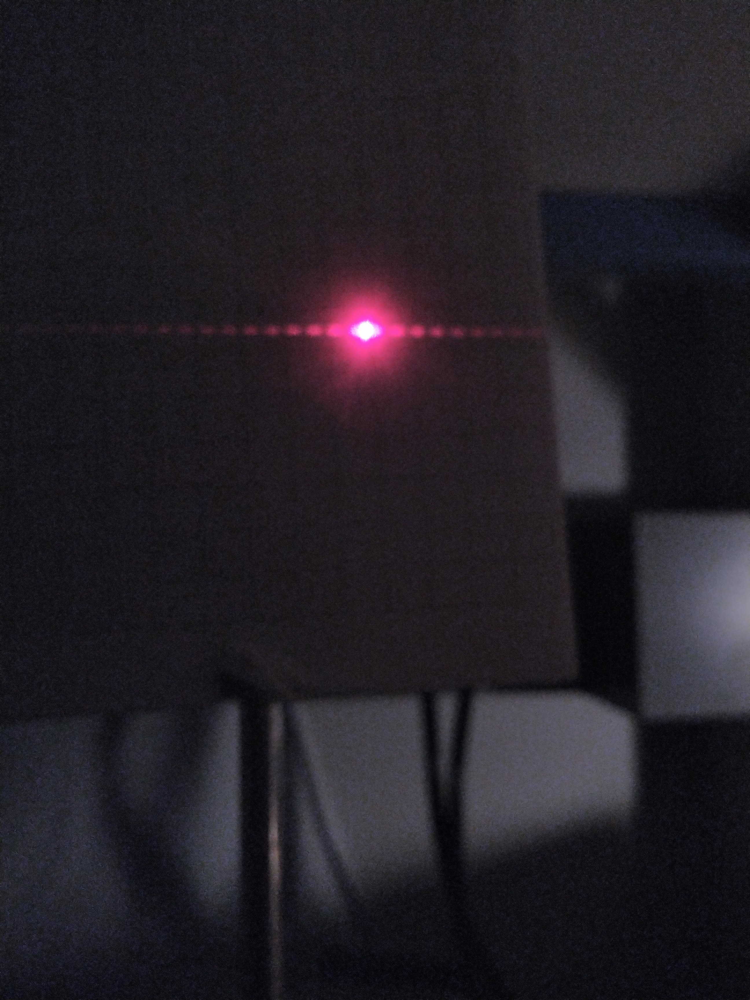

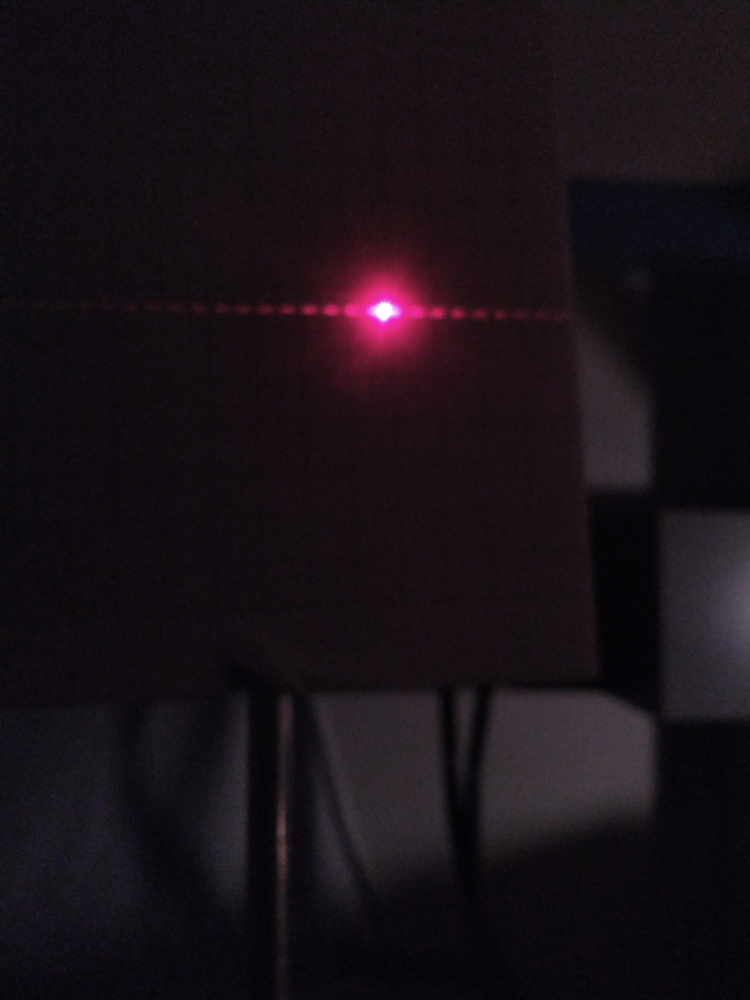

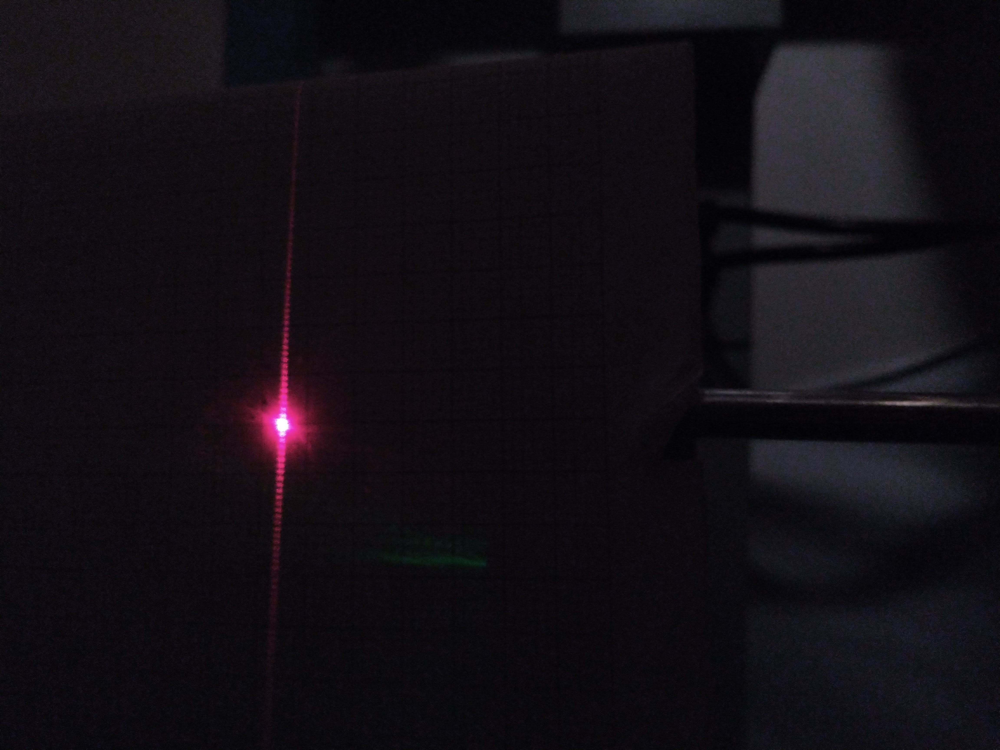

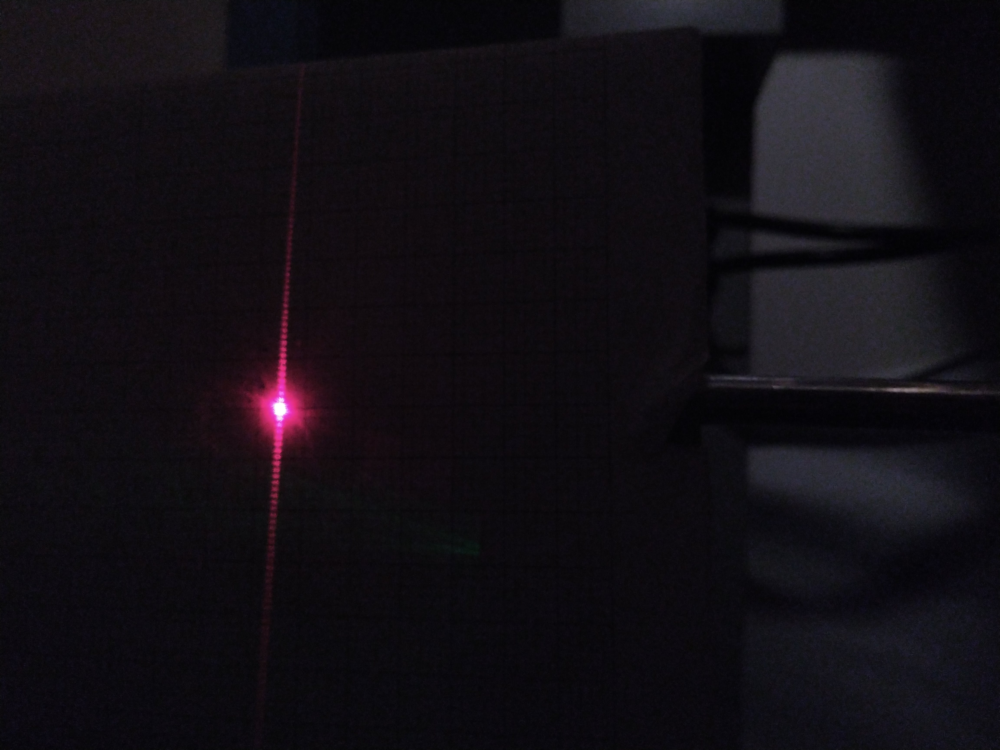

In [146]:
# for i in range(2):
#     for j in range(2):
#         reducedChi = (((maximaWidth[i][j] -maximaWidth.mean(axis=2)[i][j]) 
#                         / (maximaWidth.std(axis=2)/np.sqrt(maximaWidth.shape[2]))[i][j])**2).sum() / maximaWidth.shape[2]
    
#         print(reducedChi)

In [109]:
wireLoc = 77.5
backboard= 0.0
rLambda = 635e-9

tileWidth = np.array([[[200,196,194,195,195], [195,195,194,194,194]], 
                      [[175, 171, 176, 173, 175], [173,181,171,171,173]]])#Width of three tiles in pixels, correspondes to 3cm
conversion =3/tileWidth.mean(axis=2)  #converts pixels to centimeters

maximaWidth = np.array([[[18,18,18,16,18], [18,20,18,18,18]],
                        [[42,47,45,45,43], [41,44,42,39,41]]])#width of maxima 1 and 2 in pixels

centerWidth = (conversion * maximaWidth.mean(axis=2)).mean(axis=1)

maximaErr = (conversion*maximaWidth.std(axis=2)) / np.sqrt(maximaWidth.shape[2])
centerErr = np.linalg.norm(maximaErr,axis=1)

slitWidth = 2*(wireLoc/100)*rLambda/(centerWidth/100)
slitErr =  centerErr / centerWidth
gauge39 = 0.00353*2.54 / 100
gauge26 = 0.0159 *2.54 / 100

print('Thick Wire')
print('Calculated Maxima Width: {:.2f} mm'.format(centerWidth[0]* 1e1))
print('Width Uncertainty: {:.2f} mm'.format(centerErr[0] * 1e1))
print('Calculated Slit Width: {:.6f} mm'.format(slitWidth[0] * 1e3))
print('Slit Uncertainty: {:.6f} mm'.format(slitErr[0]))                       
print('Given Value: {:.6f} mm'.format(gauge26*1e3))

print('\nThin Wire')
print('Calculated Maxima Width: {:.2f} mm'.format(centerWidth[1]* 1e1))
print('Width Uncertainty: {:.2f} mm'.format(centerErr[1] * 1e1))
print('Calculated Slit Width: {:.6f} mm'.format(slitWidth[1] * 1e3))
print('Slit Uncertainty: {:.6f} mm'.format(slitErr[1]))                       
print('Given Value: {:6f} mm'.format(gauge39*1e3))

Thick Wire
Calculated Maxima Width: 2.77 mm
Width Uncertainty: 0.08 mm
Calculated Slit Width: 0.355750 mm
Slit Uncertainty: 0.028107 mm
Given Value: 0.403860 mm

Thin Wire
Calculated Maxima Width: 7.40 mm
Width Uncertainty: 0.18 mm
Calculated Slit Width: 0.132995 mm
Slit Uncertainty: 0.024844 mm
Given Value: 0.089662 mm


# Experiment 5

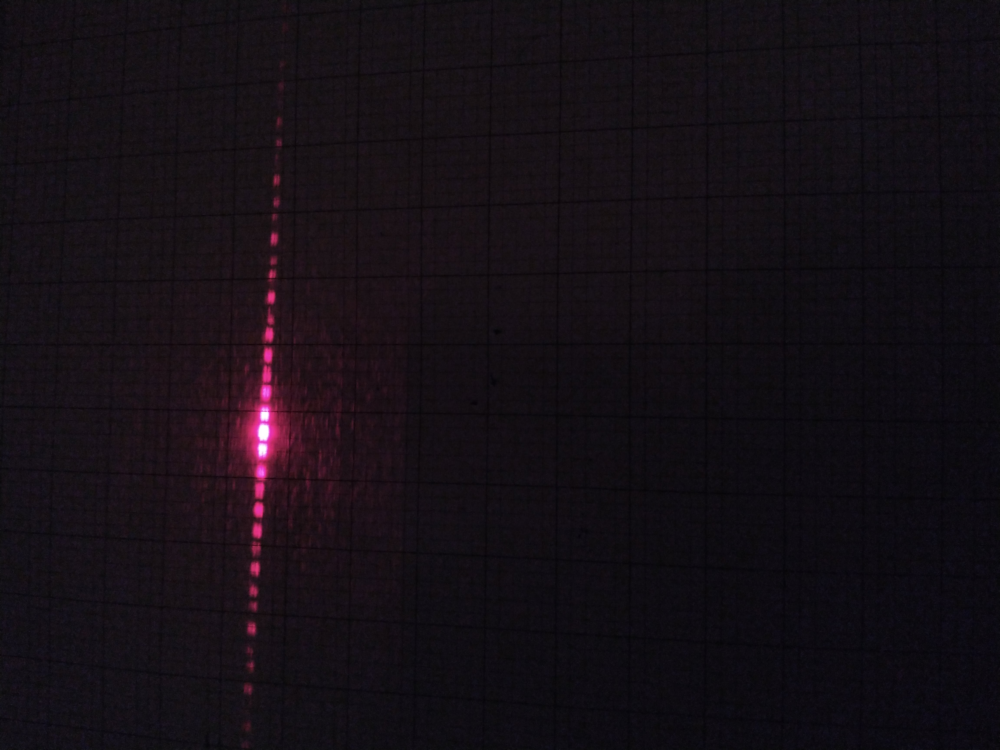

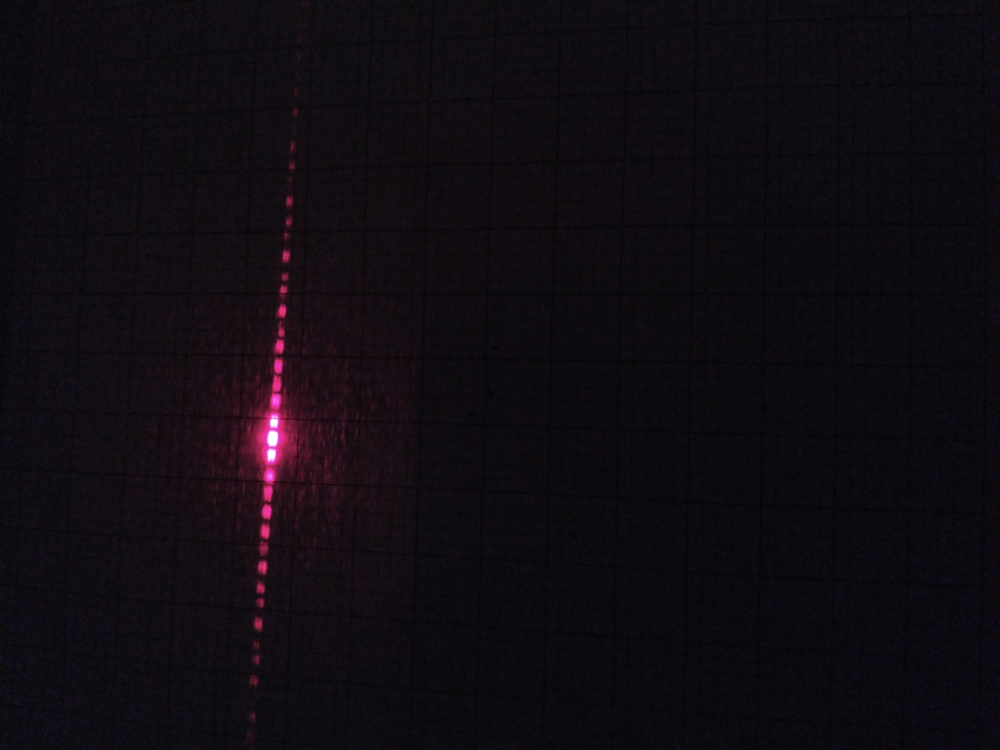

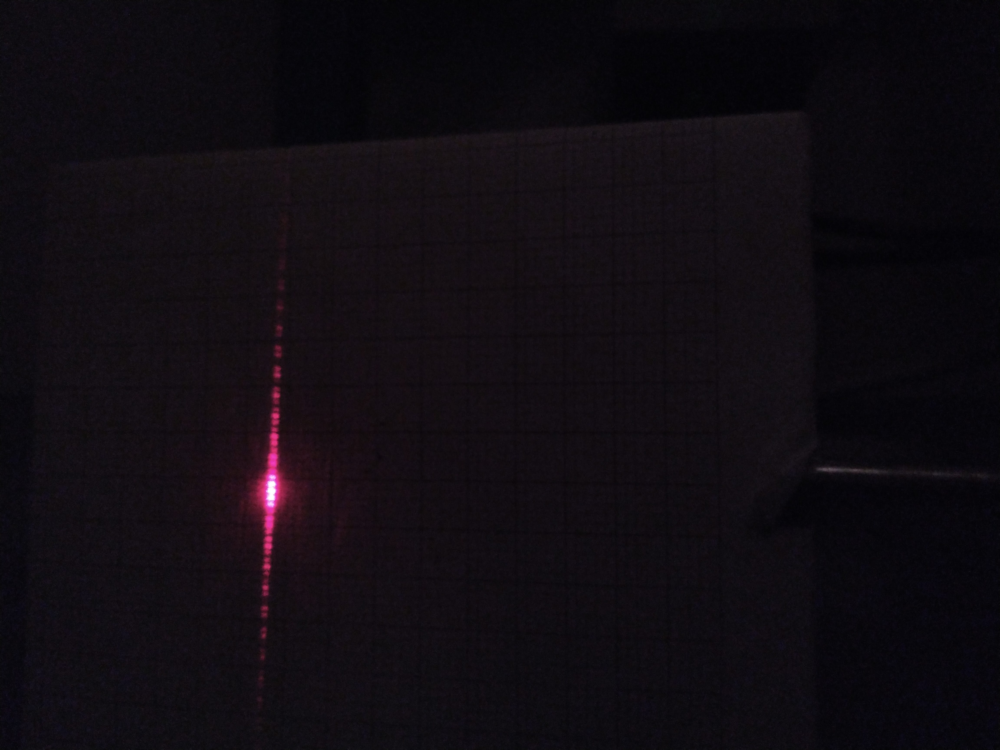

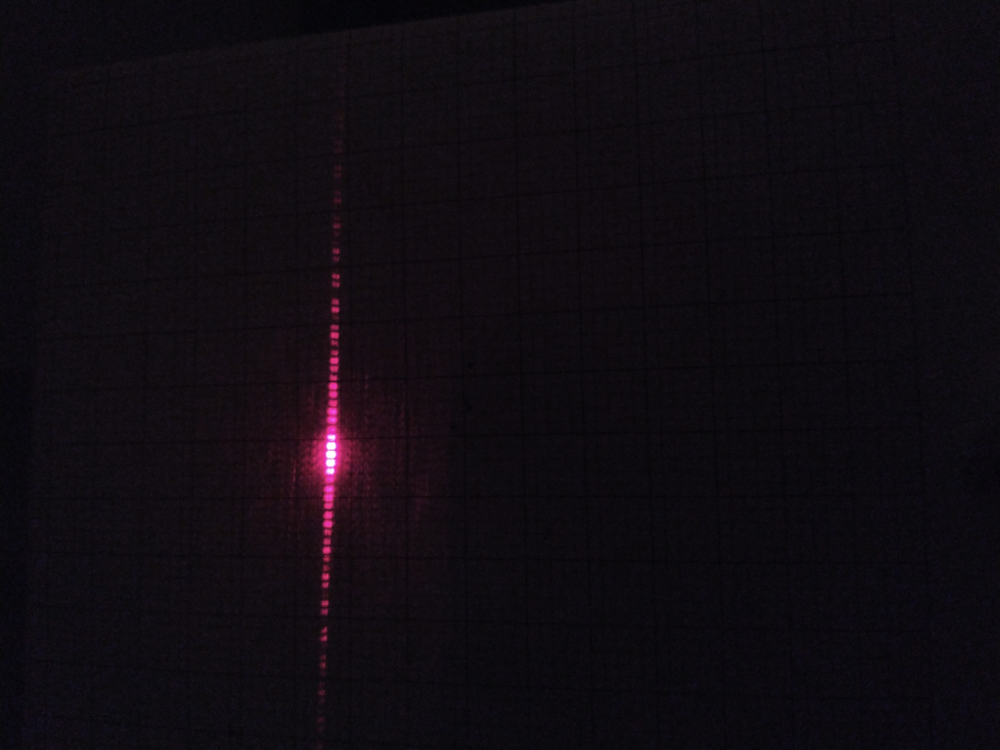

In [150]:
screenLoc = 78.9 #cm
backboard= 0.0
pt = 0.04393e-3 #pts to meters
rLambda = 635e-9

tileWidth = np.array([[[229,230,228,232,239], [184,185,182,182,181]], 
                      [[250,245,246,247,250], [260,258,262,258,260]]])#Width of three tiles in pixels, correspondes to 3cm
conversion =3/tileWidth.mean(axis=2)  #converts pixels to centimeters

maximaWidth = np.array([[[56,53,51,52,54], [47,50,48,44,42]],
                        [[69,70,68,67,66], [70,69,69,68,66]]])#width of central fringe in pixels

centerWidth = (conversion * maximaWidth.mean(axis=2)).mean(axis=1)

maximaErr = (conversion*maximaWidth.std(axis=2)) / np.sqrt(maximaWidth.shape[2])
centerErr = np.linalg.norm(maximaErr,axis=1)

slitWidth = 2*(screenLoc/100)*rLambda/(centerWidth/100)
slitErr =  centerErr / centerWidth

print('Aperture 1')
print('Calculated Maxima Width: {:.2f} mm'.format(centerWidth[0]* 1e1))
print('Width Uncertainty: {:.2f} mm'.format(centerErr[0] * 1e1))
print('Calculated Slit Width: {:.6f} mm'.format(slitWidth[0] * 1e3))
print('Slit Uncertainty: {:.6f} mm'.format(slitErr[0]))                       
print('Real Slit Width: {:.6f} mm'.format(2*pt*1e3))
print('Passes Agreement test: {}'.format(np.abs(2*pt - slitWidth[0]) < slitErr[0]*2))

print('\nAperture 2')
print('Calculated Maxima Width: {:.2f} mm'.format(centerWidth[1]* 1e1))
print('Width Uncertainty: {:.2f} mm'.format(centerErr[1] * 1e1))
print('Calculated Slit Width: {:.6f} mm'.format(slitWidth[1] * 1e3))
print('Slit Uncertainty: {:.6f} mm'.format(slitErr[1]))                       
print('Real Slit Width: {:.6f} mm'.format(2*pt*1e3))
print('Passes Agreement test: {}'.format(np.abs(2*pt - slitWidth[1]) < slitErr[1]*2))

Aperture 1
Calculated Maxima Width: 7.24 mm
Width Uncertainty: 0.23 mm
Calculated Slit Width: 0.138466 mm
Slit Uncertainty: 0.032078 mm
Real Slit Width: 0.087860 mm
Passes Agreement test: True

Aperture 2
Calculated Maxima Width: 8.07 mm
Width Uncertainty: 0.10 mm
Calculated Slit Width: 0.124140 mm
Slit Uncertainty: 0.012867 mm
Real Slit Width: 0.087860 mm
Passes Agreement test: True


In [169]:
m = 13
n = 4
d = centerWidth[0]*1e-4 * m/n 
print('Aperture 1')
print('Predicted Seperation of Slits: {:e}'.format(d))
print('Actual Sepearation of Slits: {:e}'.format(2*pt))


m = 6
n = 2
d = centerWidth[1]*1e-4 * m/n 
print('\nAperture 2')
print('Predicted Seperation of Slits: {:e}'.format(d))
print('Actual Sepearation of Slits: {:e}'.format(6*pt))


Aperture 1
Predicted Seperation of Slits: 2.351903e-04
Actual Sepearation of Slits: 8.786000e-05

Aperture 2
Predicted Seperation of Slits: 2.421535e-04
Actual Sepearation of Slits: 2.635800e-04
